## Week 2: Remote Sensing Data Sources and IO

### Lecture
Slides: https://docs.google.com/presentation/d/e/2PACX-1vRuiwyYrl8nfDl6x5N5yzepKcBLyHUiS-Ofrpg2Y_Ikn7UfaAV_lDlxwa0mEUsez5NRfnXS96MfVqpK/pub?start=false&loop=false&delayms=3000

### Additional Resources
Landsat ML Cookbook, Demetris Roumis. https://projectpythia.org/landsat-ml-cookbook/

STAC Spec: https://stacspec.org/en/ 

Cloud-Optimized Geospatial Formats Guide, https://guide.cloudnativegeo.org/ 

### Lab: Landsat Data Discovery and Access with STAC
In this lab, you will retrieve Landsat imagery for Singapore and produce a cloud-free composite image. You will work through the full workflow of discovering, inspecting, loading, and exporting satellite data using modern cloud-native tools.

You will not be given any code. Instead, you will work from documentation and tutorials to figure out how to accomplish each step. This mirrors real-world practice: the tools change constantly, but the workflow patterns remain consistent. Your job is to learn to navigate documentation and adapt examples to your specific problem.

**Study area**: Singapore  
**Time period**: 2025 (January through December)  
**Dataset**: Landsat Collection 2 Level-2 
**Goal**: Produce and export a cloud-free true-color composite

#### Reference Materials

This tutorial is based on the following resources. You are not limited to using these, but they will be helpful in pulling together the code you need to complete the lab.

[STAC Spec Tutorial: Reading STAC with Planetary Computer](https://stacspec.org/en/tutorials/reading-stac-planetary-computer/)

[Project Pythia: Data Ingestion (Geospatial)](https://projectpythia.org/landsat-ml-cookbook/notebooks/data-ingestion-geospatial/)

[Planetary Computer: Cloudless Sentinel-2 Mosaic](https://github.com/microsoft/PlanetaryComputerExamples/blob/main/tutorials/cloudless-mosaic-sentinel2.ipynb)

#### Part 1: Understand what data is available and how STAC organizes it.

1. Connect to the Planetary Computer STAC catalog using `pystac-client`.

In [ ]:
import numpy as np
import xarray as xr
import rasterio as rio
import rioxarray
import rasterio.features
import stackstac
import pystac_client
from pystac_client import Client
import planetary_computer
import xrspatial.multispectral as ms
from dask_gateway import GatewayCluster
import odc.stac
import plotly.express as px
import pandas as pd
import altair as alt
from bokeh.models import HoverTool, NumeralTickFormatter, ColorBar
from holoviews import opts
import hvplot.xarray
import panel as pn
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from rasterio.io import MemoryFile
import rio_cogeo

In [2]:
# Create a Dask Gateway cluster.
catalog = pystac_client.Client.open("https://planetarycomputer.microsoft.com/api/stac/v1",
                                    modifier=planetary_computer.sign_inplace)
# Print the catalog title.
catalog.title

'Microsoft Planetary Computer STAC API'

2. Find the Landsat Collection 2 Level-2 dataset. Per [Project Pythia](https://projectpythia.org/landsat-ml-cookbook/notebooks/data-ingestion-geospatial/):
> We’ll use the `landsat-c2-l2` dataset, which stands for Collection 2 Level-2. It contains data from several landsat missions and has better data quality than Level 1 (`landsat-c2-l1`). Microsoft Planetary Computer has descriptions of [Level 1](https://planetarycomputer.microsoft.com/dataset/landsat-c2-l1) and [Level 2](https://planetarycomputer.microsoft.com/dataset/landsat-c2-l2), but a direct and succinct comparison can be found in [this community post](https://gis.stackexchange.com/questions/439767/landsat-collections), and the information can be verified with [USGS](https://www.usgs.gov/landsat-missions/landsat-collection-2).

In [3]:
# Get the Landsat Collection 2 Level 2 collection.
collection = "landsat-c2-l2"
level2_collection = catalog.get_collection(collection)

3. Explore the metadata by simply examining the collection object. What's the description? STAC version? Check out the links, the ID, the license, keywords, etc. List the assets available in this collection. What bands are available? What other assets (e.g., QA bands, thumbnails) are included?

In [4]:
# Return the Landsat Collection 2.
level2_collection

<CollectionClient id=landsat-c2-l2>

#### Part 2: Query for imagery over your study area and verify the results make sense.

4. Define a bounding box for Singapore. Hint: we deliberately chose Singapore because it's small enough to fit within a single Landsat tile; this simplifies loading.

In [5]:
# Define the bounding box for Singapore.
sgp_bbox = [103.6920359, 1.1304753, 104.0120359, 1.4504753]

5. Set up a Dask cluster for parallel processing. Use `odc.stac.configure_rio(cloud_defaults=True, client=client)` to configure `rasterio` for efficient cloud COG access. This step is critical—without it, loading data from the cloud will be extremely slow.

In [6]:
# Configure ODC STAC for cloud-optimized access.
odc.stac.configure_rio(cloud_defaults=True)

6. Search for Landsat scenes within your bounding box for 2025. Filter for scenes with less than 50% cloud cover. (Singapore is cloudy; you may need to adjust this threshold to get enough scenes.)

In [7]:
# Search for Landsat 8 scenes over Singapore in 2025 with less than 50% cloud cover.
cloudy = 50 # Percent.
datetime = "2025-01-01/2025-12-31"

# Perform the search.
search = catalog.search(
    collections = [collection],
    bbox = sgp_bbox,
    datetime = datetime,
    query = {"eo:cloud_cover": {"lt": cloudy}}
)

# Get the items from the search.
items = search.item_collection()
print(f"Returned {len(items)} items.")

# Create a dictionary mapping item indices and IDs.
item_id = {(i, item.id): i for i, item in enumerate(items)}
item_id

Returned 23 items.


{(0, 'LC08_L2SP_125059_20251205_02_T1'): 0,
 (1, 'LC09_L2SP_125059_20251026_02_T1'): 1,
 (2, 'LC08_L2SP_125059_20251018_02_T1'): 2,
 (3, 'LC08_L2SP_125059_20251002_02_T1'): 3,
 (4, 'LC09_L2SP_125059_20250924_02_T1'): 4,
 (5, 'LC08_L2SP_125059_20250916_02_T2'): 5,
 (6, 'LC08_L2SP_125059_20250831_02_T1'): 6,
 (7, 'LC08_L2SP_125059_20250815_02_T1'): 7,
 (8, 'LC09_L2SP_125059_20250807_02_T1'): 8,
 (9, 'LC08_L2SP_125059_20250730_02_T1'): 9,
 (10, 'LC09_L2SP_125059_20250706_02_T1'): 10,
 (11, 'LC09_L2SP_125059_20250604_02_T1'): 11,
 (12, 'LC08_L2SP_125059_20250527_02_T1'): 12,
 (13, 'LC08_L2SP_125059_20250511_02_T1'): 13,
 (14, 'LC09_L2SP_125059_20250503_02_T1'): 14,
 (15, 'LC08_L2SP_125059_20250425_02_T1'): 15,
 (16, 'LC08_L2SP_125059_20250409_02_T1'): 16,
 (17, 'LC09_L2SP_125059_20250401_02_T1'): 17,
 (18, 'LC08_L2SP_125059_20250308_02_T1'): 18,
 (19, 'LC08_L2SP_125059_20250220_02_T1'): 19,
 (20, 'LC09_L2SP_125059_20250212_02_T1'): 20,
 (21, 'LC09_L2SP_125059_20250127_02_T2'): 21,
 (22, 'L

7. Preview your results. How many scenes did you get? Look at some thumbnails to verify you're getting what you expect.

In [8]:
# Create a Panel widget to select an item and display its preview.
item_preview = pn.widgets.Select(value = 1, options = item_id, name = "item")

# Function to get the preview image for the selected item.
def get_preview(i):
    return pn.panel(items[i].assets["rendered_preview"].href, height = 300)

# Display the item selector and the corresponding preview image.
pn.Row(item_preview, pn.bind(get_preview, item_preview))

BokehModel(combine_events=True, render_bundle={'docs_json': {'a95eefd0-9390-47d2-b5c6-c9a33eedc293': {'version…

In [9]:
selected_item = items[1]
selected_item

<Item id=LC09_L2SP_125059_20251026_02_T1>

8. Visualize the STAC item footprints on a map. Do the tiles cover your entire bounding box? Are there gaps?

In [10]:
# Extract band information from the selected item.
assets = []

# Loop through the assets of the selected item and extract band metadata.
for _, asset in selected_item.assets.items():
    try:
        assets.append(asset.extra_fields["eo:bands"][0])
    except:
        pass

# Create a DataFrame to display the band information.
cols_ordered = [
    "common_name",
    "description",
    "name",
    "center_wavelength",
    "full_width_half_max"
]

# Create DataFrame from the assets dictionary.
bands = pd.DataFrame.from_dict(assets)[cols_ordered]

bands

,common_name,description,name,center_wavelength,full_width_half_max
0,red,Visible red,OLI_B4,0.65,0.04
1,blue,Visible blue,OLI_B2,0.48,0.06
2,green,Visible green,OLI_B3,0.56,0.06
3,nir08,Near infrared,OLI_B5,0.87,0.03
4,lwir11,Long-wave infrared,TIRS_B10,10.90,0.59
5,swir16,Short-wave infrared,OLI_B6,1.61,0.09
6,swir22,Short-wave infrared,OLI_B7,2.20,0.19
7,coastal,Coastal/Aerosol,OLI_B1,0.44,0.02


In [11]:
# Load the selected item using ODC STAC, specifying bands of interest and bounding box.
bands_of_interest = ["red", "green", "blue"]

# Load the data into an xarray dataset.
ds = odc.stac.stac_load(
    [selected_item],
    bands = bands_of_interest,
    bbox = sgp_bbox,
    chunks = {},
).isel(time = 0)

ds

<xarray.Dataset> Size: 8MB
Dimensions:      (y: 1180, x: 1188)
Coordinates:
  * y            (y) float64 9kB 1.604e+05 1.603e+05 ... 1.25e+05 1.25e+05
  * x            (x) float64 10kB 3.545e+05 3.545e+05 ... 3.901e+05 3.901e+05
    spatial_ref  int32 4B 32648
    time         datetime64[ns] 8B 2025-10-26T03:16:56.862517
Data variables:
    red          (y, x) uint16 3MB dask.array<chunksize=(1180, 1188), meta=np.ndarray>
    green        (y, x) uint16 3MB dask.array<chunksize=(1180, 1188), meta=np.ndarray>
    blue         (y, x) uint16 3MB dask.array<chunksize=(1180, 1188), meta=np.ndarray>

In [12]:
# Convert the dataset to an xarray DataArray for easier manipulation.
da = ds.to_array(dim = "band").compute()

da

<xarray.DataArray (band: 3, y: 1180, x: 1188)> Size: 8MB
array([[[ 8886,  8668,  8207, ..., 19154, 18642, 15246],
        [ 8530,  8446,  8182, ..., 18397, 16925, 12693],
        [ 8342,  8310,  8022, ..., 16628, 13135, 10585],
        ...,
        [ 7500,  7428,  7435, ..., 11185, 11118, 11635],
        [ 7395,  7399,  7418, ..., 11887, 12178, 12286],
        [ 7376,  7421,  7422, ..., 11225, 12284, 12699]],

       [[10011,  9459,  8727, ..., 19278, 19012, 15974],
        [ 9358,  9296,  8785, ..., 18772, 17386, 13608],
        [ 9158,  9095,  8502, ..., 17478, 14294, 11833],
        ...,
        [ 8754,  8691,  8665, ..., 11168, 11064, 11657],
        [ 8622,  8584,  8603, ..., 11888, 11277, 11645],
        [ 8563,  8586,  8575, ..., 11031, 11123, 11480]],

       [[ 8333,  8182,  7939, ..., 18923, 17915, 14323],
        [ 8086,  8042,  7880, ..., 18097, 16157, 11875],
        [ 7908,  7867,  7770, ..., 15488, 12599,  9547],
        ...,
        [ 7783,  7709,  7692, ..., 10075,  9743, 10687],
        [ 7638,  7619,  7653, ..., 11193, 10373, 10723],
        [ 7604,  7653,  7627, ..., 10150, 10344, 10174]]],
      shape=(3, 1180, 1188), dtype=uint16)
Coordinates:
  * band         (band) object 24B 'red' 'green' 'blue'
  * y            (y) float64 9kB 1.604e+05 1.603e+05 ... 1.25e+05 1.25e+05
  * x            (x) float64 10kB 3.545e+05 3.545e+05 ... 3.901e+05 3.901e+05
    spatial_ref  int32 4B 32648
    time         datetime64[ns] 8B 2025-10-26T03:16:56.862517

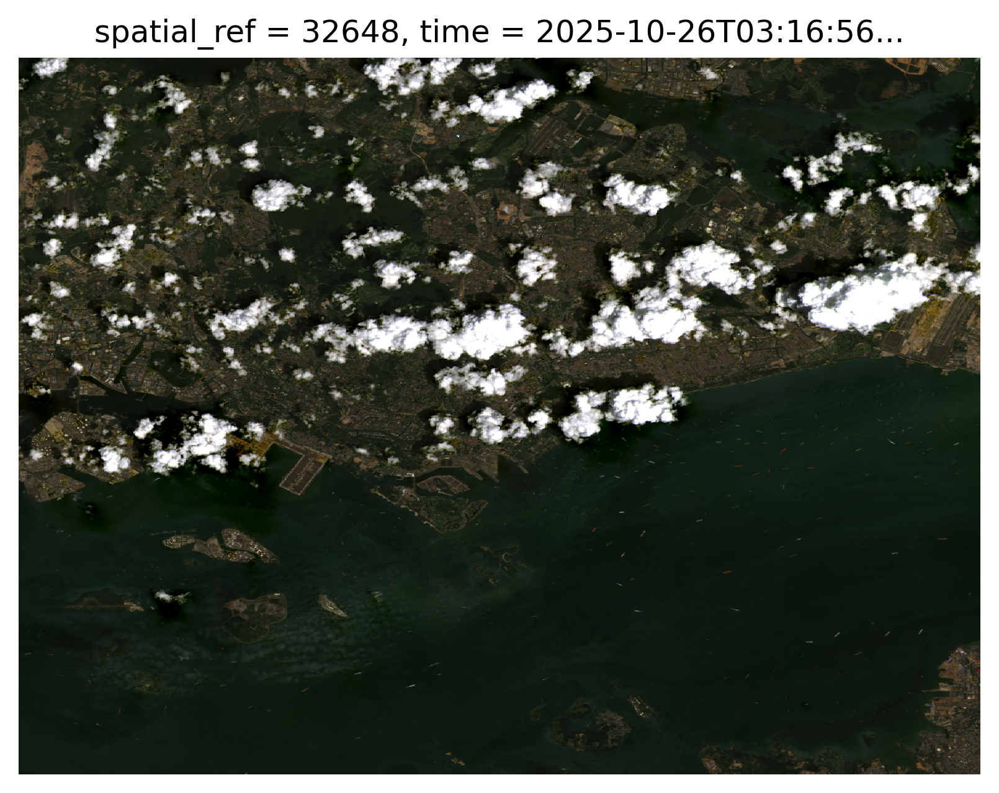

In [13]:
# Visualize the data using xarray's built-in plotting.
plt.rcParams["figure.dpi"] = 300

da.plot.imshow(robust = True, size = 5).axes.set_axis_off()

9. Create a time series plot showing cloud cover percentage per scene across the year.

In [14]:
dates = []
cloud_covers = []

# Loop through items and extract datetime and cloud cover properties.
for scene in items:
    dates.append(scene.properties["datetime"])
    cloud_covers.append(scene.properties["eo:cloud_cover"])

# Create a DataFrame to hold the scene dates and cloud cover values.
scene_df = pd.DataFrame({
    "date": dates,
    "cloud_cover": cloud_covers
})

# Convert the date column to datetime format.
scene_df["date"] = pd.to_datetime(scene_df["date"])

scene_df.sort_values("date", inplace = True)

In [15]:
# Create a time series plot using Plotly Express.
time_series_fig = px.line(
    x = scene_df["date"],
    y = scene_df["cloud_cover"],
    labels = {"x" : "Date", "y": "Cloud Cover %"},
    title = "Landsat 8 Cloud Cover Over Singapore in 2025"
)

time_series_fig.show()

In [16]:
# Create a copy of the scene_df DataFrame to modify cloud cover values.
scene_percent_df = scene_df.copy()

# Divide cloud_cover column by 100.
scene_percent_df["cloud_cover"] = scene_percent_df["cloud_cover"] / 100

In [17]:
# Create an Altair line chart to visualize cloud cover over time.
alt.Chart(scene_percent_df).mark_line(point = True).encode(
    alt.X("date:T").title("Date"),
    alt.Y("cloud_cover").axis(format = "%").title("Cloud Cover %"),
).properties(
    title = "Landsat 8 Cloud Cover Over Singapore in 2025",
    width = 800,
    height = 400).interactive()

alt.Chart(...)

#### Part 3: Combine multiple scenes into a single cloud-free image.

10. Load the data using `odc.stac.load`. Include the spectral bands (red, green, blue, nir08) and qa_pixel for cloud masking. Experiment with different resolutions and chunk sizes to get the data to load efficiently. A couple of hints:
 - We deliberately selected Singapore to avoid the need to load multiple tiles to cover the AOI.
 - Landsat data is 30m resolution. You _can_ coarsen this to load more quickly, but if you optimize your chunking, you should be able to load all of your data at 30m resolution in a couple of minutes.
 - If you get _really_ stuck, feel free to look at the solutions notebook.

In [18]:
# Load multiple items with additional bands using ODC STAC.
target_bands = ["red", "green", "blue", "nir08", "qa_pixel"]

# Load the data into an xarray dataset.
ds = odc.stac.stac_load(
    items,
    bands = target_bands,
    bbox = sgp_bbox,
    resolution = 30,
    chunks = {"time": 1}
).isel(time = 0)

ds

<xarray.Dataset> Size: 14MB
Dimensions:      (y: 1180, x: 1188)
Coordinates:
  * y            (y) float64 9kB 1.604e+05 1.603e+05 ... 1.25e+05 1.25e+05
  * x            (x) float64 10kB 3.545e+05 3.545e+05 ... 3.901e+05 3.901e+05
    spatial_ref  int32 4B 32648
    time         datetime64[ns] 8B 2025-01-03T03:16:41.531333
Data variables:
    red          (y, x) uint16 3MB dask.array<chunksize=(1180, 1188), meta=np.ndarray>
    green        (y, x) uint16 3MB dask.array<chunksize=(1180, 1188), meta=np.ndarray>
    blue         (y, x) uint16 3MB dask.array<chunksize=(1180, 1188), meta=np.ndarray>
    nir08        (y, x) uint16 3MB dask.array<chunksize=(1180, 1188), meta=np.ndarray>
    qa_pixel     (y, x) uint16 3MB dask.array<chunksize=(1180, 1188), meta=np.ndarray>

11. Examine the resulting dataset. What are its dimensions? What's the CRS? How much data would you be loading if you called `.compute()` right now?

In [19]:
# Convert the dataset to an xarray DataArray for easier manipulation.
da = ds.to_array(dim = "band").compute()

da

<xarray.DataArray (band: 5, y: 1180, x: 1188)> Size: 14MB
array([[[ 8174,  8063,  8113, ...,  8307,  8324,  8307],
        [ 7892,  7810,  7910, ...,  8371,  8385,  8401],
        [ 7900,  7795,  7927, ...,  8452,  8474,  8522],
        ...,
        [ 7648,  7663,  7684, ..., 10865, 11244, 10670],
        [ 7625,  7592,  7602, ..., 10668, 12267, 10861],
        [ 7680,  7592,  7523, ..., 11008, 11565, 11649]],

       [[ 9227,  8824,  8736, ...,  9752,  9772,  9768],
        [ 8733,  8570,  8664, ...,  9805,  9829,  9832],
        [ 8733,  8657,  8679, ...,  9854,  9876,  9850],
        ...,
        [ 9212,  9225,  9317, ..., 10768, 10860, 10565],
        [ 9182,  9127,  9169, ..., 10557, 11935, 10029],
        [ 9272,  9132,  9026, ..., 10588, 10438, 10324]],

       [[ 7983,  7940,  8031, ...,  8249,  8263,  8274],
        [ 7753,  7731,  7797, ...,  8304,  8317,  8320],
        [ 7717,  7623,  7711, ...,  8359,  8369,  8355],
        ...,
        [ 8667,  8676,  8696, ...,  9270, 10036,  9478],
        [ 8641,  8620,  8633, ...,  9974, 10134,  8517],
        [ 8688,  8624,  8537, ...,  9080,  9009,  8573]],

       [[21897, 19147, 18204, ...,  7112,  7111,  7116],
        [18622, 18618, 18358, ...,  7152,  7152,  7162],
        [18096, 17957, 16754, ...,  7179,  7207,  7399],
        ...,
        [ 7016,  7022,  7026, ..., 14832, 14267, 15478],
        [ 7013,  7015,  7012, ..., 14393, 16046, 14394],
        [ 7037,  7019,  7014, ..., 14144, 14718, 14549]],

       [[21824, 21824, 21824, ..., 21952, 21952, 21952],
        [21824, 21824, 21824, ..., 21952, 21952, 21952],
        [21824, 21824, 21824, ..., 21952, 21952, 21952],
        ...,
        [21952, 21952, 21952, ..., 21824, 21824, 21824],
        [21952, 21952, 21952, ..., 21824, 21824, 21824],
        [21952, 21952, 21952, ..., 21824, 21824, 21824]]],
      shape=(5, 1180, 1188), dtype=uint16)
Coordinates:
  * band         (band) object 40B 'red' 'green' 'blue' 'nir08' 'qa_pixel'
  * y            (y) float64 9kB 1.604e+05 1.603e+05 ... 1.25e+05 1.25e+05
  * x            (x) float64 10kB 3.545e+05 3.545e+05 ... 3.901e+05 3.901e+05
    spatial_ref  int32 4B 32648
    time         datetime64[ns] 8B 2025-01-03T03:16:41.531333

12. Create a cloud mask using the `qa_pixel` band. Bits 3 and 4 indicate cloud and cloud shadow respectively. Mask out cloudy pixels so they become NaN.

In [20]:
# Apply cloud and shadow masking using the qa_pixel band.
qa_pixel = ds["qa_pixel"]
cloud_bit = (qa_pixel >> 3) & 1
shadow_bit = (qa_pixel >> 4) & 1

# Create a cloud mask where either cloud or shadow bits are set.
cloud_mask = (cloud_bit == 1) | (shadow_bit == 1)

# Mask the DataArray using the cloud mask.
da_masked = da.where(~cloud_mask, np.nan)

da_masked

<xarray.DataArray (band: 5, y: 1180, x: 1188)> Size: 56MB
dask.array<where, shape=(5, 1180, 1188), dtype=float64, chunksize=(5, 1180, 1188), chunktype=numpy.ndarray>
Coordinates:
  * band         (band) object 40B 'red' 'green' 'blue' 'nir08' 'qa_pixel'
  * y            (y) float64 9kB 1.604e+05 1.603e+05 ... 1.25e+05 1.25e+05
  * x            (x) float64 10kB 3.545e+05 3.545e+05 ... 3.901e+05 3.901e+05
    spatial_ref  int32 4B 32648
    time         datetime64[ns] 8B 2025-01-03T03:16:41.531333

13. Create a median composite across all time steps. Because cloudy pixels are NaN, the median will ignore them and select from clear observations only. Call `.compute()` to trigger the actual download and computation.

In [21]:
# Compute the final masked DataArray.
da_final = da_masked.compute()

da_final

<xarray.DataArray (band: 5, y: 1180, x: 1188)> Size: 56MB
array([[[ 8174.,  8063.,  8113., ...,  8307.,  8324.,  8307.],
        [ 7892.,  7810.,  7910., ...,  8371.,  8385.,  8401.],
        [ 7900.,  7795.,  7927., ...,  8452.,  8474.,  8522.],
        ...,
        [ 7648.,  7663.,  7684., ..., 10865., 11244., 10670.],
        [ 7625.,  7592.,  7602., ..., 10668., 12267., 10861.],
        [ 7680.,  7592.,  7523., ..., 11008., 11565., 11649.]],

       [[ 9227.,  8824.,  8736., ...,  9752.,  9772.,  9768.],
        [ 8733.,  8570.,  8664., ...,  9805.,  9829.,  9832.],
        [ 8733.,  8657.,  8679., ...,  9854.,  9876.,  9850.],
        ...,
        [ 9212.,  9225.,  9317., ..., 10768., 10860., 10565.],
        [ 9182.,  9127.,  9169., ..., 10557., 11935., 10029.],
        [ 9272.,  9132.,  9026., ..., 10588., 10438., 10324.]],

       [[ 7983.,  7940.,  8031., ...,  8249.,  8263.,  8274.],
        [ 7753.,  7731.,  7797., ...,  8304.,  8317.,  8320.],
        [ 7717.,  7623.,  7711., ...,  8359.,  8369.,  8355.],
        ...,
        [ 8667.,  8676.,  8696., ...,  9270., 10036.,  9478.],
        [ 8641.,  8620.,  8633., ...,  9974., 10134.,  8517.],
        [ 8688.,  8624.,  8537., ...,  9080.,  9009.,  8573.]],

       [[21897., 19147., 18204., ...,  7112.,  7111.,  7116.],
        [18622., 18618., 18358., ...,  7152.,  7152.,  7162.],
        [18096., 17957., 16754., ...,  7179.,  7207.,  7399.],
        ...,
        [ 7016.,  7022.,  7026., ..., 14832., 14267., 15478.],
        [ 7013.,  7015.,  7012., ..., 14393., 16046., 14394.],
        [ 7037.,  7019.,  7014., ..., 14144., 14718., 14549.]],

       [[21824., 21824., 21824., ..., 21952., 21952., 21952.],
        [21824., 21824., 21824., ..., 21952., 21952., 21952.],
        [21824., 21824., 21824., ..., 21952., 21952., 21952.],
        ...,
        [21952., 21952., 21952., ..., 21824., 21824., 21824.],
        [21952., 21952., 21952., ..., 21824., 21824., 21824.],
        [21952., 21952., 21952., ..., 21824., 21824., 21824.]]],
      shape=(5, 1180, 1188))
Coordinates:
  * band         (band) object 40B 'red' 'green' 'blue' 'nir08' 'qa_pixel'
  * y            (y) float64 9kB 1.604e+05 1.603e+05 ... 1.25e+05 1.25e+05
  * x            (x) float64 10kB 3.545e+05 3.545e+05 ... 3.901e+05 3.901e+05
    spatial_ref  int32 4B 32648
    time         datetime64[ns] 8B 2025-01-03T03:16:41.531333

#### Part 4: Visualize and export your results.

14. Plot individual bands (red, green, blue, NIR) as separate grayscale images.

In [22]:
# Select the red band for visualization.
da_red = da_final.sel(band = "red")

red_plot = da_red.hvplot.image(
    title = "Landsat 8 Red Band Over Singapore (Cloud Mask)",
    cmap = "Reds",
    colorbar = True,
    rasterize = True,
    width = 600,
    height = 500,
    xaxis = None,
    yaxis = None
).opts(
    tools = ["hover"],
    hover_tooltips = [("Red Value", "@image{0, 0.00}")]
)

red_plot

BokehModel(combine_events=True, render_bundle={'docs_json': {'cceb2626-65a3-42b8-a52e-7021b2ea15f2': {'version…

In [23]:
# Select the green band for visualization.
da_green = da_final.sel(band = "green")

green_plot = da_green.hvplot.image(
    title = "Landsat 8 Green Band Over Singapore (Cloud Mask)",
    cmap = "Greens",
    colorbar = True,
    rasterize = True,
    width = 600,
    height = 500,
    xaxis = None,
    yaxis = None
).opts(
    tools = ["hover"],
    hover_tooltips = [("Green Value", "@image{0, 0.00}")]
)

green_plot

BokehModel(combine_events=True, render_bundle={'docs_json': {'a5b2f26c-050f-4d98-bd58-bd6523d2712d': {'version…

In [24]:
# Select the blue band for visualization.
da_blue = da_final.sel(band = "blue")

blue_plot = da_blue.hvplot.image(
    title = "Landsat 8 Blue Band Over Singapore (Cloud Mask)",
    cmap = "Blues",
    colorbar = True,
    rasterize = True,
    width = 600,
    height = 500,
    xaxis = None,
    yaxis = None
).opts(
    tools = ["hover"],
    hover_tooltips = [("Blue Value", "@image{0, 0.00}")]
)

blue_plot

BokehModel(combine_events=True, render_bundle={'docs_json': {'a0aeff9c-a3a5-465e-a329-b046bd10fddd': {'version…

In [25]:
# Select the NIR band for visualization.
da_nir = da_final.sel(band = "nir08")

nir_plot = da_nir.hvplot.image(
    title = "Landsat 8 NIR Band Over Singapore (Cloud Mask)",
    cmap = "Grays",
    colorbar = True,
    rasterize = True,
    width = 600,
    height = 500,
    xaxis = None,
    yaxis = None
).opts(
    tools = ["hover"],
    hover_tooltips = [("NIR Value", "@image{0, 0.00}")]
)

nir_plot

BokehModel(combine_events=True, render_bundle={'docs_json': {'a38803ff-ab4c-497c-83cd-013a7c21fd10': {'version…

In [26]:
# Combine the individual band plots into a single 2x2 layout.
combined_plot = (red_plot + green_plot + blue_plot + nir_plot).cols(2).opts(
    title = "Landsat 8 Spectral Bands Over Singapore 2025 (Cloud-Free Composite)",
    width = 600,
    height = 600,
)

combined_plot

BokehModel(combine_events=True, render_bundle={'docs_json': {'40127bf0-388e-4d2f-8f2e-517c8637ea24': {'version…

15. Plot a true-color composite and a false-color composite. You'll need to stack the bands and normalize the values appropriately.

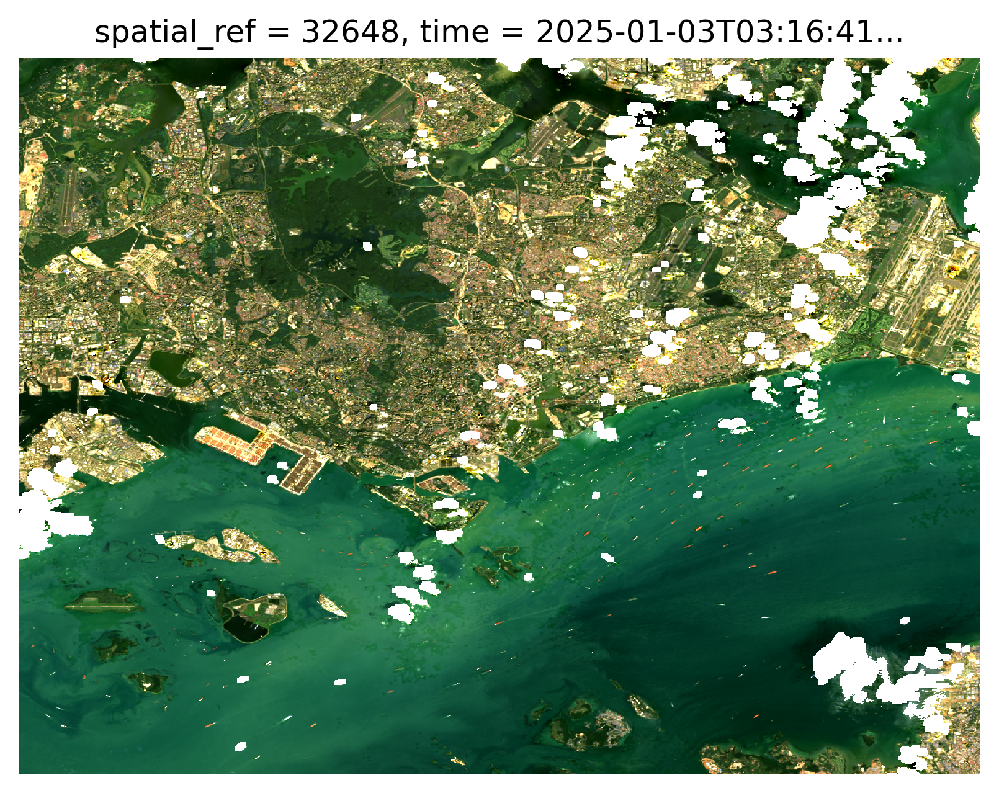

In [27]:
# Create a true-color composite by selecting the red, green, and blue bands.
true_color = da_final.sel(band = ["red", "green", "blue"])

# Normalize the true-color composite to the range 0-255.
true_color = (true_color - true_color.min()) / (true_color.max() - true_color.min()) * 255.0

# Plot true-color composite of the masked data.
true_color_plot = true_color.plot.imshow(robust = True, size = 5).axes.set_axis_off()

true_color_plot

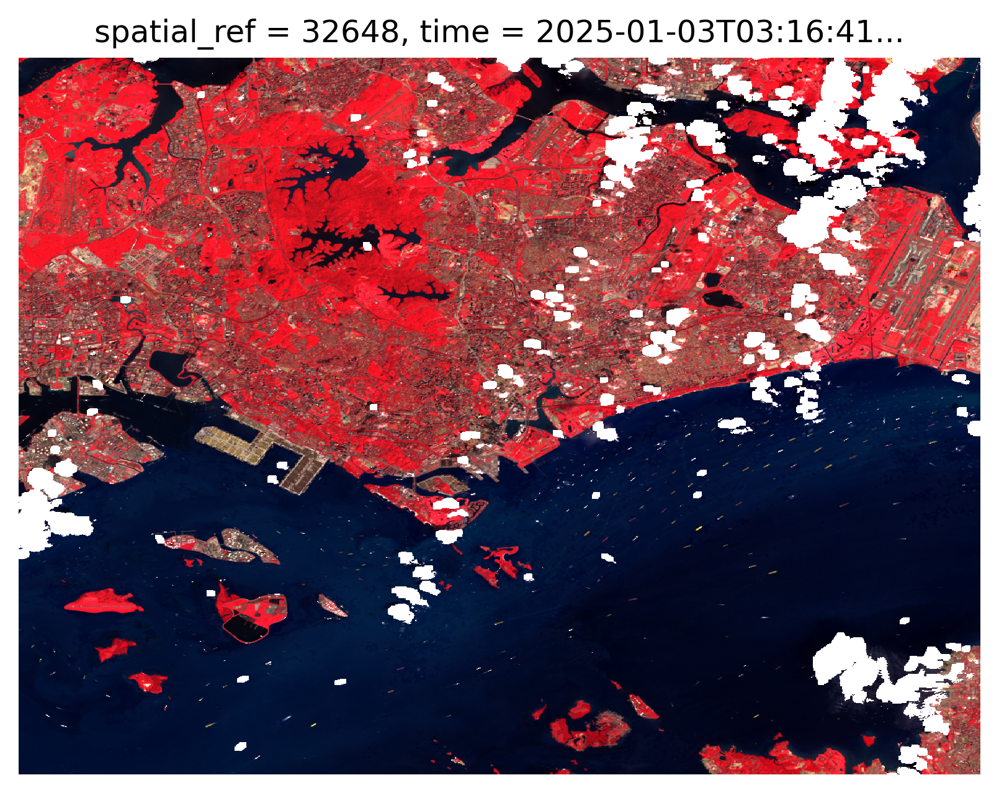

In [28]:
# Create a false-color composite with NIR, Red, and Green.
false_color = da_final.sel(band = ["nir08", "red", "green"])

# Normalize the false-color composite to the range 0-255.
false_color = (false_color - false_color.min()) / (false_color.max() - false_color.min()) * 255.0

# Plot false-color composite of the masked data.
false_color_plot = false_color.plot.imshow(robust = True, size = 5).axes.set_axis_off()

false_color_plot

16. Export your true-color composite as a Cloud-Optimized GeoTIFF (COG). Open in QGIS or ArcGIS and compare it to a satellite basemap of your choice.

In [33]:
# Export the true-color and false-color composites to Cloud Optimized GeoTIFFs (COG).
output_true_filepath = "singapore_landsat8_true_color_cog.tif"
output_false_filepath = "singapore_landsat8_false_color_cog.tif"

# Get CRS and transform from the dataset.
crs = ds.rio.crs
transform = ds.rio.transform()

In [34]:
# Prepare true-color data (normalize to 0-255 uint8).
true_color_array = da_final.sel(band = ["red", "green", "blue"]).values
true_color_array = ((true_color_array - np.nanmin(true_color_array)) / 
                    (np.nanmax(true_color_array) - np.nanmin(true_color_array)) * 255).astype("uint8")

# Prepare false-color data (normalize to 0-255 uint8).
false_color_array = da_final.sel(band = ["nir08", "red", "green"]).values
false_color_array = ((false_color_array - np.nanmin(false_color_array)) / 
                     (np.nanmax(false_color_array) - np.nanmin(false_color_array)) * 255).astype("uint8")

In [ ]:
# Export true-color composite to COG.
kwargs_true = dict(
    driver = "GTiff",
    height = true_color_array.shape[1],
    width = true_color_array.shape[2],
    count = 3,
    dtype = "uint8",
    crs = crs,
    transform = transform
)

with MemoryFile() as memfile:
    with memfile.open(**kwargs_true) as mem:
        mem.write(true_color_array)
        dst_profile = cog_profiles.get("lzw")
        cog_translate(
            mem,
            output_true_filepath,
            dst_profile,
            use_cog_driver = True,
            in_memory = False
        )

C:\Users\Tess\AppData\Local\Temp\ipykernel_41464\2049778982.py:16: RasterioDeprecationWarning:

Source dataset should be opened in read-only mode. Use of datasets opened in modes other than 'r' will be disallowed in a future version.

Reading input: <open DatasetWriter name='/vsimem/0c9edcc8-4598-4b01-ae65-688fe2bb98ab/0c9edcc8-4598-4b01-ae65-688fe2bb98ab.tif' mode='w+'>



Adding overviews...
Updating dataset tags...
Writing output to: singapore_landsat8_true_color_cog.tif


In [ ]:
# Export false-color composite to COG.
kwargs_false = dict(
    driver = "GTiff",
    height = false_color_array.shape[1],
    width = false_color_array.shape[2],
    count = 3,
    dtype = "uint8",
    crs = crs,
    transform = transform
)

with MemoryFile() as memfile:
    with memfile.open(**kwargs_false) as mem:
        mem.write(false_color_array)
        dst_profile = cog_profiles.get("lzw")
        cog_translate(
            mem,
            output_false_filepath,
            dst_profile,
            use_cog_driver = True,
            in_memory = False
        )

C:\Users\Tess\AppData\Local\Temp\ipykernel_41464\4147266664.py:16: RasterioDeprecationWarning:

Source dataset should be opened in read-only mode. Use of datasets opened in modes other than 'r' will be disallowed in a future version.

Reading input: <open DatasetWriter name='/vsimem/b8494d52-eb2b-46dd-b2b6-b47c36059972/b8494d52-eb2b-46dd-b2b6-b47c36059972.tif' mode='w+'>

Adding overviews...
Updating dataset tags...
Writing output to: singapore_landsat8_false_color_cog.tif


In [ ]:
rio_cogeo.cog_validate("singapore_landsat8_true_color_cog.tif")

(True, [], [])

In [44]:
rio_cogeo.cog_validate("singapore_landsat8_false_color_cog.tif")

(True, [], [])